In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random
from random import sample, getrandbits
import keras
from keras.utils import HDF5Matrix

import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image, ImageFilter, ImageEnhance 

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

Using TensorFlow backend.


['camelyonpatch_level_2_split_valid_x.h5', 'camelyonpatch_level_2_split_train_mask.h5', 'camelyonpatch_level_2_split_train_y.h5', 'camelyonpatch_level_2_split_test_meta.csv', 'camelyonpatch_level_2_split_train_meta.csv', 'camelyonpatch_level_2_split_test_y.h5', 'camelyonpatch_level_2_split_valid_meta.csv', 'camelyonpatch_level_2_split_valid_y.h5', 'camelyonpatch_level_2_split_train_x.h5-002', 'camelyonpatch_level_2_split_test_x.h5']


In [2]:
# Import dataset
x_train = HDF5Matrix('../input/camelyonpatch_level_2_split_train_x.h5-002/camelyonpatch_level_2_split_train_x.h5-002', 'x')
mask_train = HDF5Matrix('../input/camelyonpatch_level_2_split_train_mask.h5/camelyonpatch_level_2_split_train_mask.h5', 'mask')
y_train = HDF5Matrix('../input/camelyonpatch_level_2_split_train_y.h5/camelyonpatch_level_2_split_train_y.h5', 'y')               
x_val = HDF5Matrix('../input/camelyonpatch_level_2_split_valid_x.h5/camelyonpatch_level_2_split_valid_x.h5', 'x')
y_val = HDF5Matrix('../input/camelyonpatch_level_2_split_valid_y.h5/camelyonpatch_level_2_split_valid_y.h5', 'y')
x_test = HDF5Matrix('../input/camelyonpatch_level_2_split_test_x.h5/camelyonpatch_level_2_split_test_x.h5', 'x')

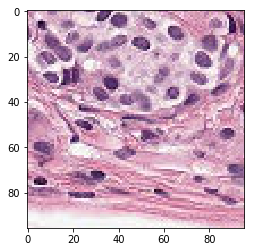

In [3]:
image = x_test[1992]
plt.imshow(image)
plt.show()

## #Basic

### 90 rotations

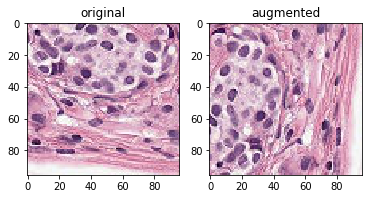

In [4]:
angles=[0, 90]
angle = sample(angles, 1)
im = Image.fromarray(image)
im = im.rotate(angle=90)
image_rotated = np.array(im)

plt.subplot(121)
plt.imshow(image)
plt.title('original')
plt.subplot(122)
plt.imshow(image_rotated)
plt.title('augmented')
plt.show()

## Mirroring

In [5]:
def mirroring(image):
    a = getrandbits(2)
    if a == 3:
        im_aug = np.fliplr(np.flipud(image))
    elif a == 2:
        im_aug = np.flipud(image)
    elif a == 1:
        im_aug = np.fliplr(image)
    else:
        im_aug = image
    return im_aug

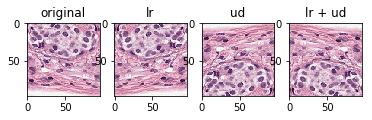

In [6]:
im_lr = np.fliplr(image)
im_ud = np.flipud(image)
im_lr_ud = np.flipud(np.fliplr(image))
im_ud_lr = np.fliplr(np.flipud(image))

plt.subplot(141)
plt.imshow(image)
plt.title('original')
plt.subplot(142)
plt.imshow(im_lr)
plt.title('lr')
plt.subplot(143)
plt.imshow(im_ud)
plt.title('ud')
plt.subplot(144)
plt.imshow(im_lr_ud)
plt.title('lr + ud')
plt.show()


## #Morphological trasformation

### Elastic transformation (Simard et al 2003) [https://gist.github.com/chsasank/4d8f68caf01f041a6453e67fb30f8f5a](http://)

In [7]:
import numpy as np
from scipy.ndimage.interpolation import map_coordinates
from scipy.ndimage.filters import gaussian_filter

def elastic_transform(image, alpha, sigma, random_state=None):
    """Elastic deformation of images as described in [Simard2003]_.
    .. [Simard2003] Simard, Steinkraus and Platt, "Best Practices for
       Convolutional Neural Networks applied to Visual Document Analysis", in
       Proc. of the International Conference on Document Analysis and
       Recognition, 2003.
    """
    assert len(image.shape)==3

    if random_state is None:
        random_state = np.random.RandomState(None)

    shape_2d = image[:,:,0].shape

    dx = gaussian_filter((random_state.rand(*shape_2d) * 2 - 1), sigma, mode="constant", cval=0) * alpha
    dy = gaussian_filter((random_state.rand(*shape_2d) * 2 - 1), sigma, mode="constant", cval=0) * alpha

    x, y = np.meshgrid(np.arange(shape_2d[0]), np.arange(shape_2d[1]), indexing='ij')
    indices = np.reshape(x+dx, (-1, 1)), np.reshape(y+dy, (-1, 1))
    
    r = map_coordinates(image[:,:,0], indices, order=1).reshape(shape_2d)
    g = map_coordinates(image[:,:,1], indices, order=1).reshape(shape_2d)
    b = map_coordinates(image[:,:,2], indices, order=1).reshape(shape_2d)
   
    return np.stack((r,g,b), axis=2)

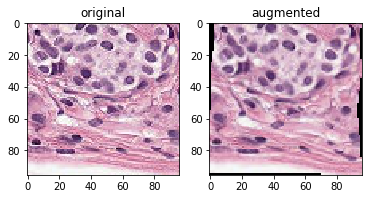

In [8]:
image_r_augm = elastic_transform(image, 80, 10)

plt.subplot(121)
plt.imshow(image)
plt.title('original')
plt.subplot(122)
plt.imshow(image_r_augm)
plt.title('augmented')
plt.show()

### Gaussian blurring

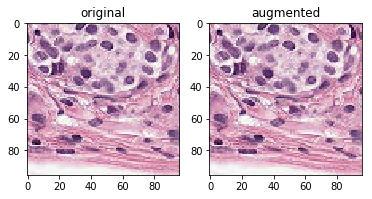

In [9]:
im = Image.fromarray(image)
out = im.filter(ImageFilter.GaussianBlur(0.1))
out = np.array(out)

plt.subplot(121)
plt.imshow(image)
plt.title('original')
plt.subplot(122)
plt.imshow(out)
plt.title('augmented')
plt.show()

### Gaussian Noise

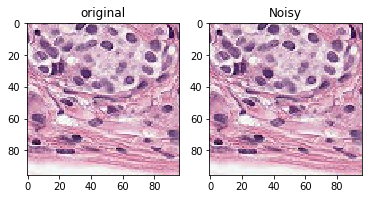

In [10]:
import numpy as np
import cv2
img = image
mean = 0
var = 10
sigma = 0.1

def gaussian_noise(image, sigma):
    gaussian = np.random.normal(mean, sigma, image[:,:,0].shape)
    noisy_image = np.zeros(img.shape, np.float32)

    if len(img.shape) == 2:
        noisy_image = img + gaussian
    else:
        noisy_image[:, :, 0] = img[:, :, 0] + gaussian
        noisy_image[:, :, 1] = img[:, :, 1] + gaussian
        noisy_image[:, :, 2] = img[:, :, 2] + gaussian

    cv2.normalize(noisy_image, noisy_image, 0, 255, cv2.NORM_MINMAX, dtype=-1)
    noisy_image = noisy_image.astype(np.uint8)
    
    return noisy_image

out = gaussian_noise(image, sigma)

plt.subplot(121)
plt.imshow(image)
plt.title('original')
plt.subplot(122)
plt.imshow(out)
plt.title('Noisy')
plt.show()

## #Brightness & contrast (BC)

### Brightness

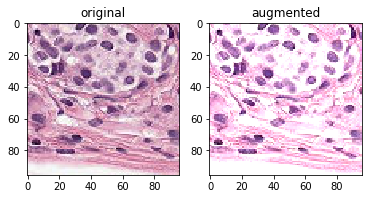

In [11]:
im = Image.fromarray(image)
enhancer = ImageEnhance.Brightness(im)
enhanced_im = enhancer.enhance(1.35)
out = np.array(enhanced_im)

plt.subplot(121)
plt.imshow(image)
plt.title('original')
plt.subplot(122)
plt.imshow(out)
plt.title('augmented')
plt.show()

### Contrast

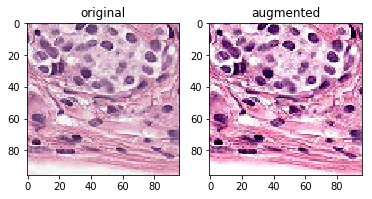

In [12]:
im = Image.fromarray(image)
enhancer = ImageEnhance.Contrast(im)
enhanced_im = enhancer.enhance(1.5)
out = np.array(enhanced_im)

plt.subplot(121)
plt.imshow(image)
plt.title('original')
plt.subplot(122)
plt.imshow(out)
plt.title('augmented')
plt.show()

## #HSV

In [13]:
from skimage.color import rgb2hsv, hsv2rgb

def hsv_shifting(image, ratio):
    hsv_im = rgb2hsv(image)
    
    a = np.random.uniform(low= 1-ratio, high= 1+ratio, size=1)[0]
    b = np.random.uniform(low= -ratio, high= ratio, size=1)[0]
    
    hsv_im[:,:,0] = a * hsv_im[:,:,0] + b
    hsv_im[:,:,1] = a * hsv_im[:,:,1] + b
    
    
    new_im = hsv2rgb(hsv_im)
    
    return new_im

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


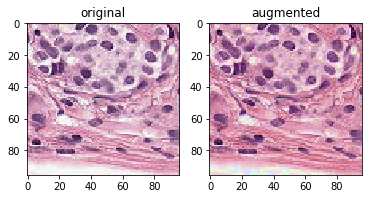

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


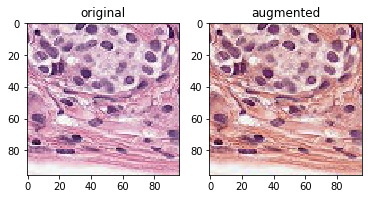

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


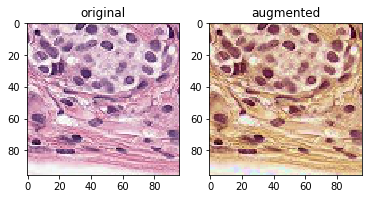

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


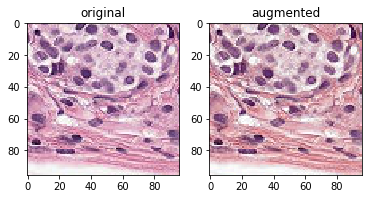

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


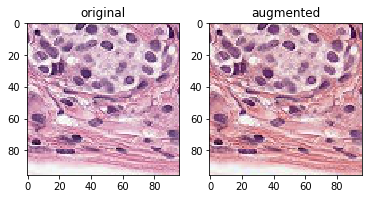

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


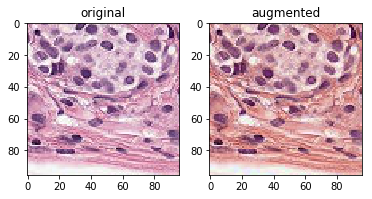

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


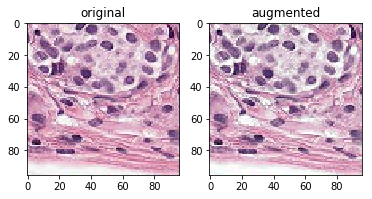

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


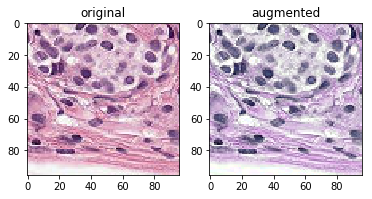

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


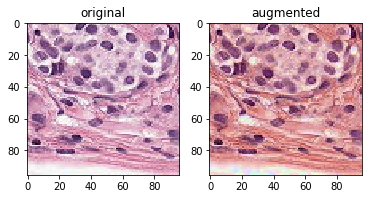

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


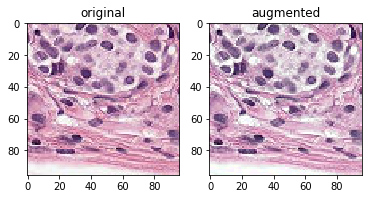

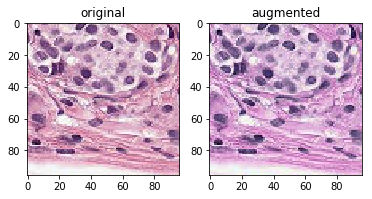

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


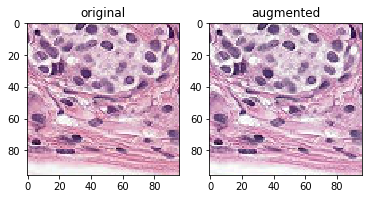

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


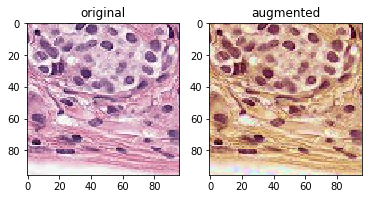

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


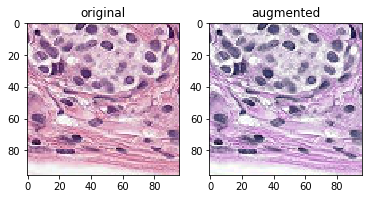

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


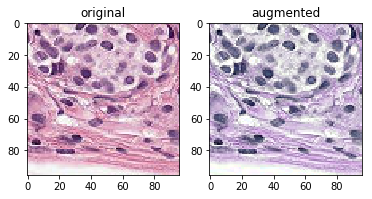

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


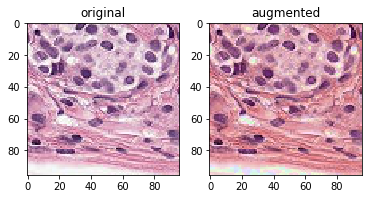

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


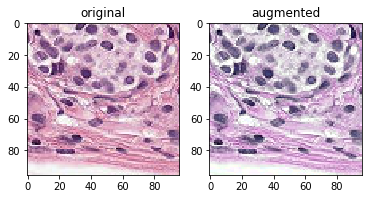

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


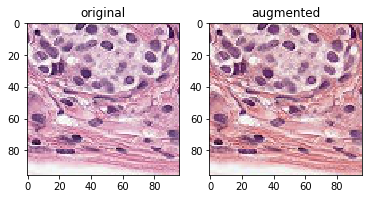

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


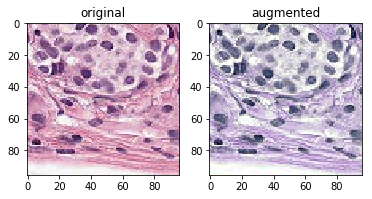

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


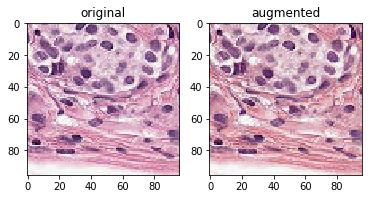

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


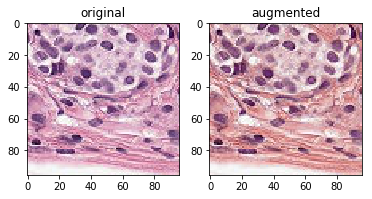

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


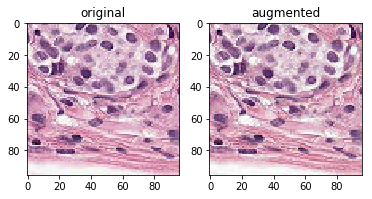

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


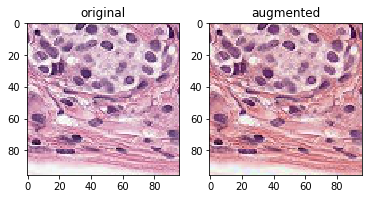

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


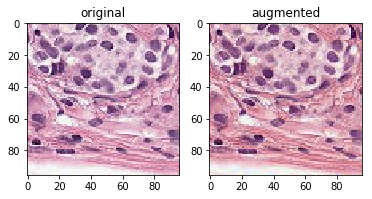

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


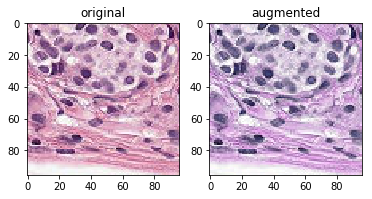

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


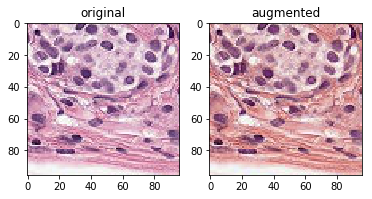

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


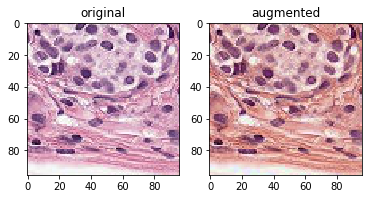

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


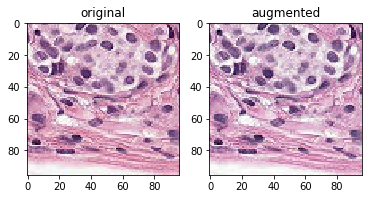

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


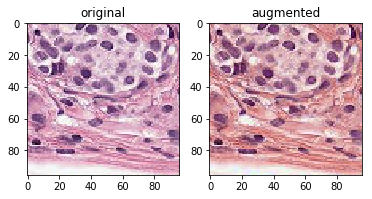

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


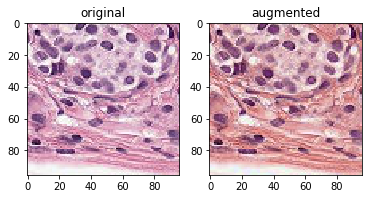

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


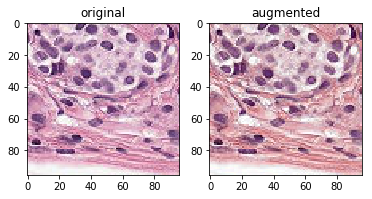

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


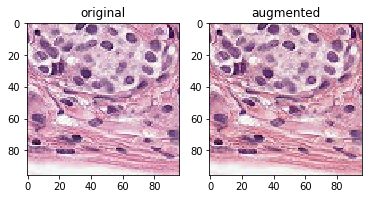

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


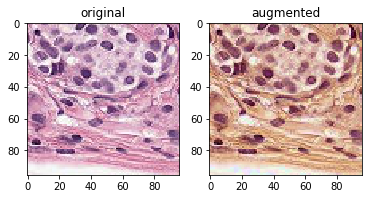

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


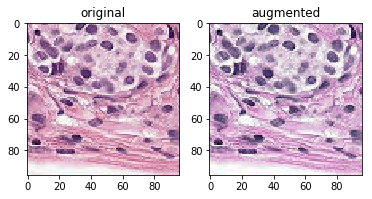

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


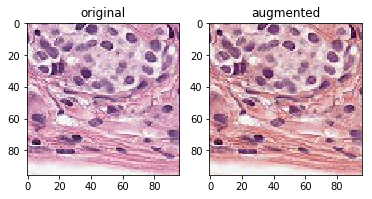

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


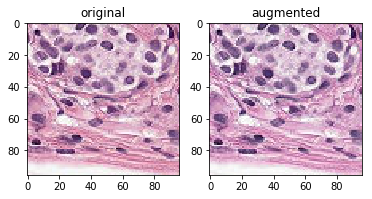

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


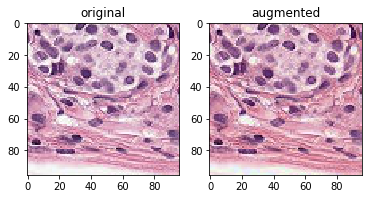

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


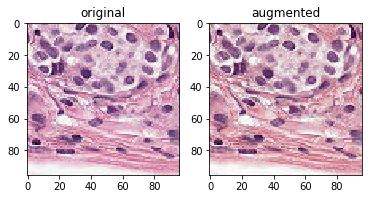

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


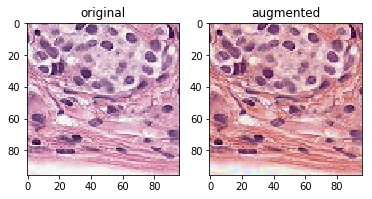

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


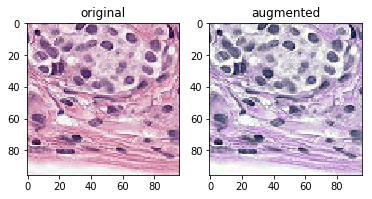

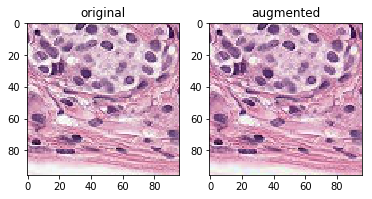

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


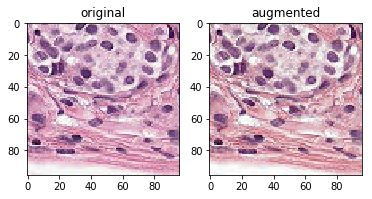

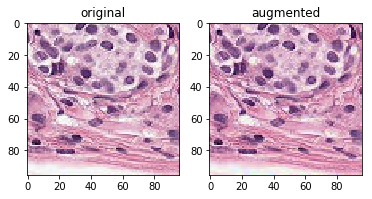

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


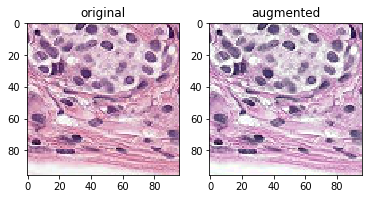

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


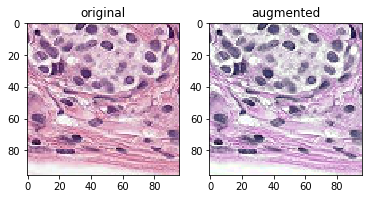

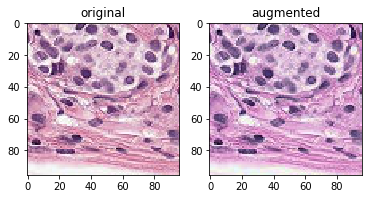

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


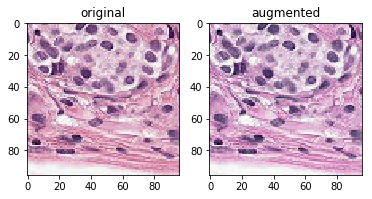

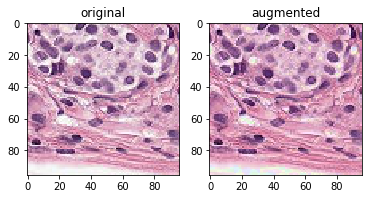

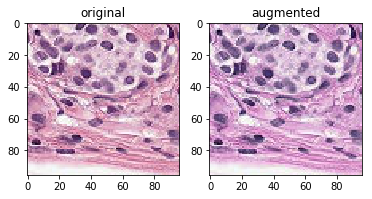

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


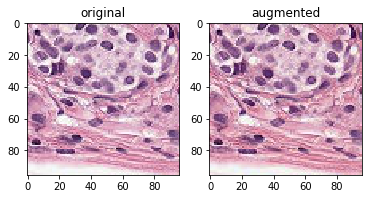

In [14]:
# test light
r = 0.1
image = x_test[1992]

for i in range(50):
    out = hsv_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


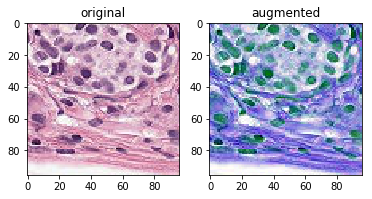

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


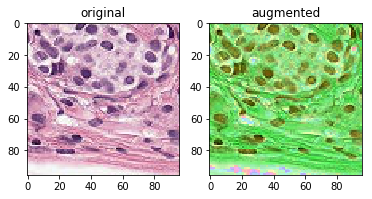

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


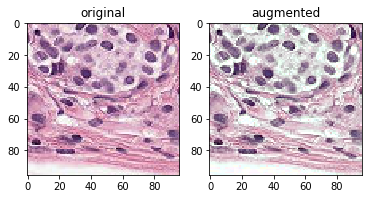

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


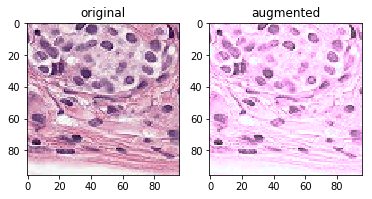

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


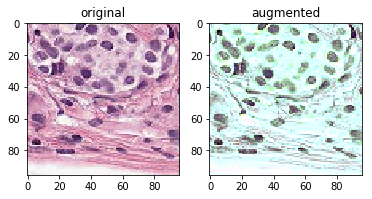

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


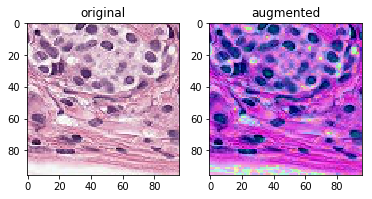

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


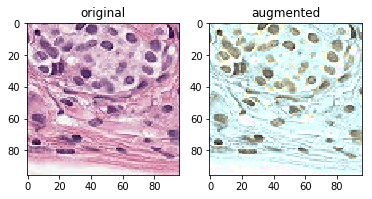

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


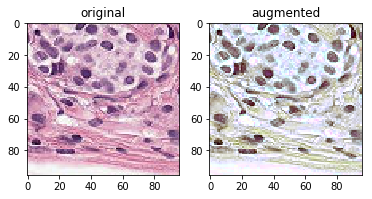

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


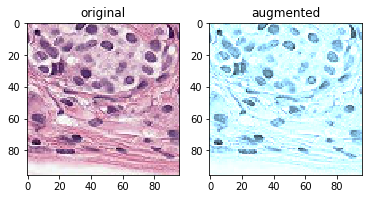

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


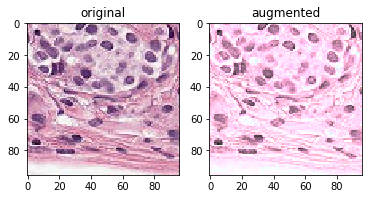

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


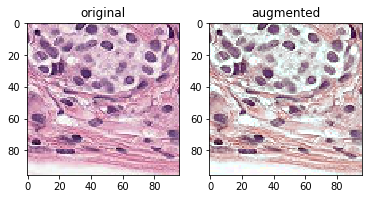

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


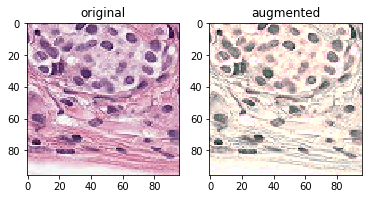

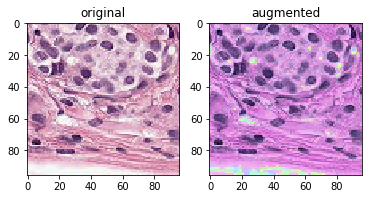

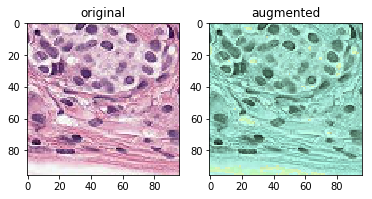

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


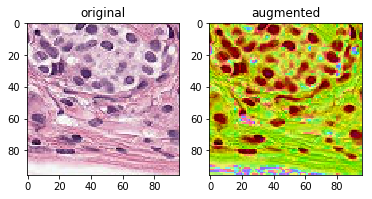

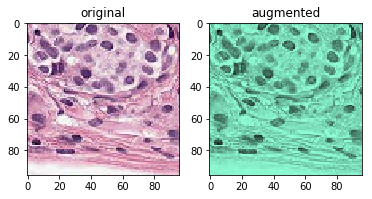

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


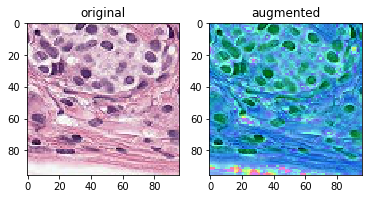

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


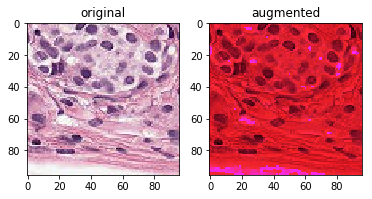

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


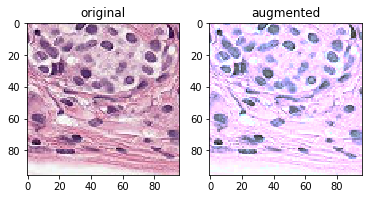

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


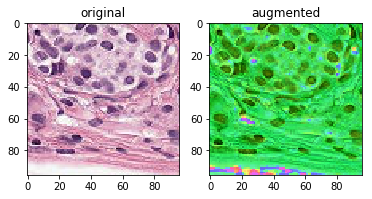

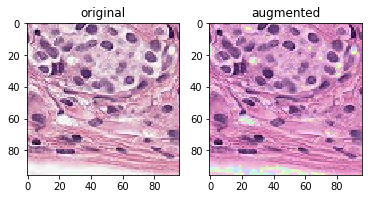

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


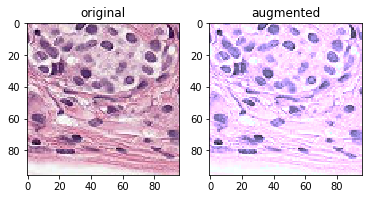

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


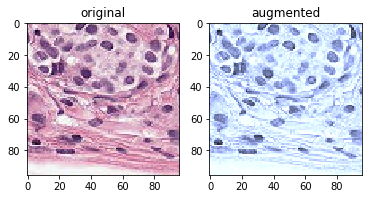

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


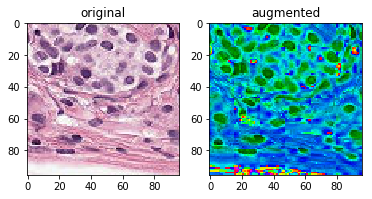

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


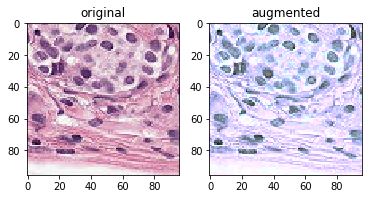

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


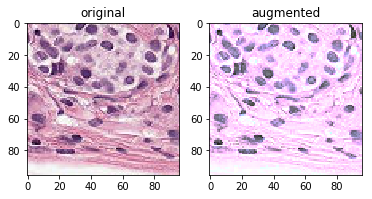

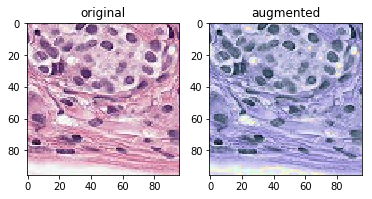

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


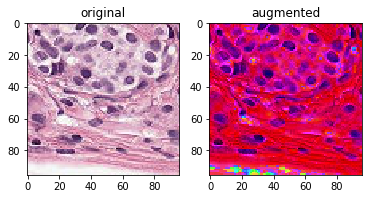

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


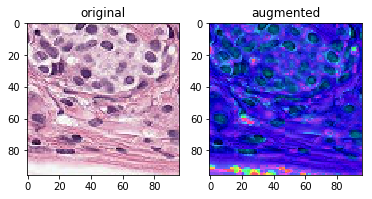

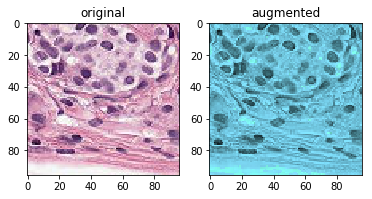

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


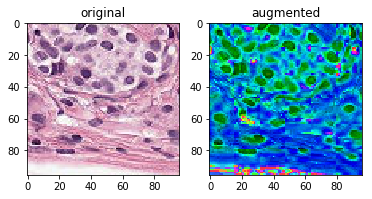

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


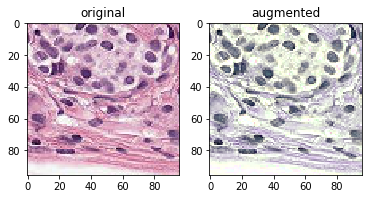

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


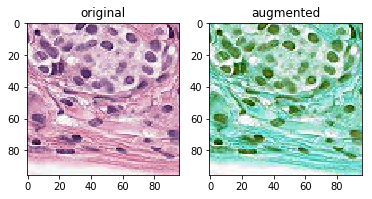

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


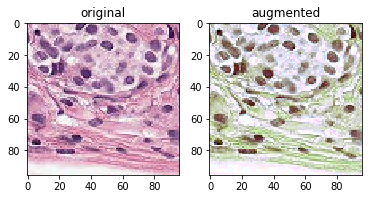

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


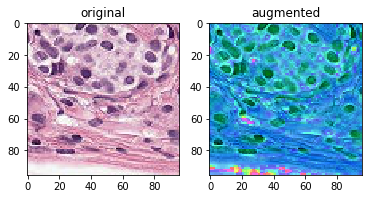

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


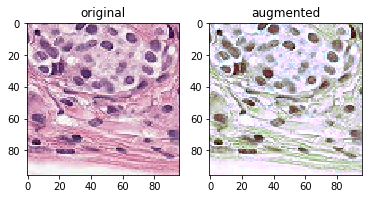

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


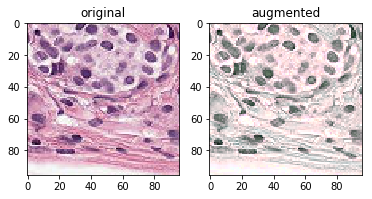

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


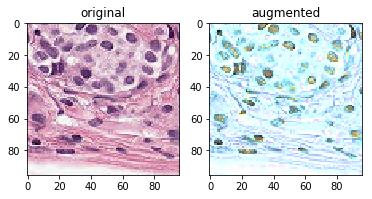

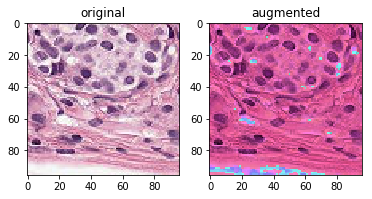

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


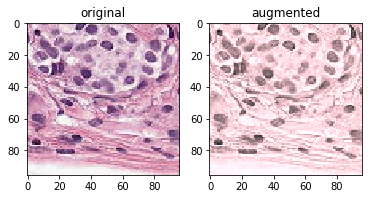

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


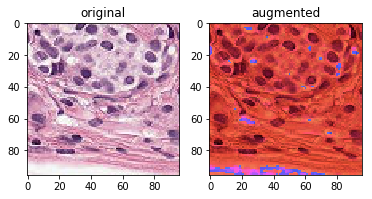

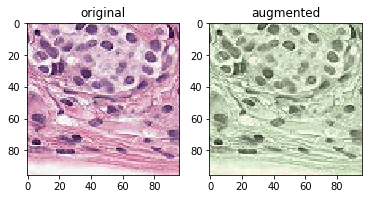

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


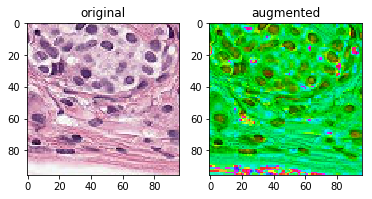

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


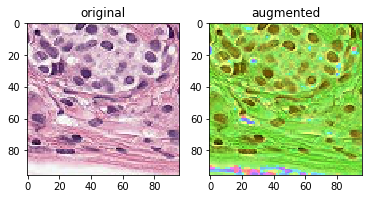

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


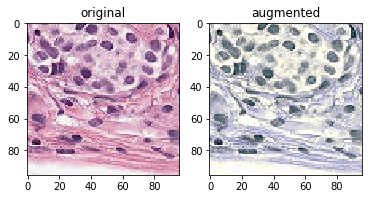

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


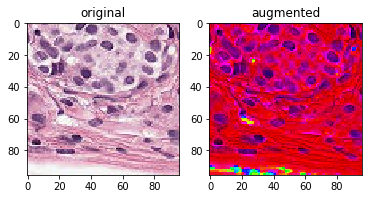

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


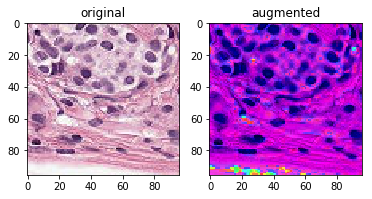

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


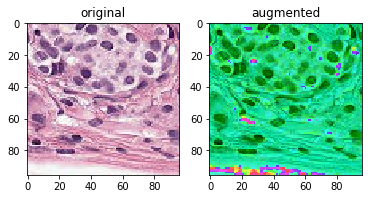

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


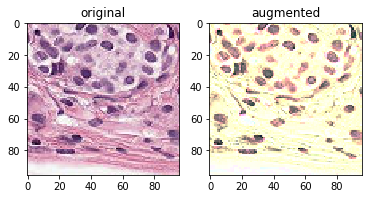

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


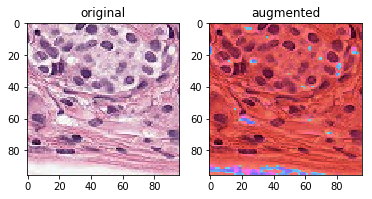

In [15]:
# test strong
r = 1
image = x_test[1992]

for i in range(50):
    out = hsv_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

## #HED

In [16]:
from skimage.color import rgb2hed, hed2rgb
from skimage.exposure import rescale_intensity

def hed_shifting(image, ratio):
    hed_im = rgb2hed(image)
    
    a = np.random.uniform(low= 1-ratio, high= 1+ratio, size=1)[0]
    b = np.random.uniform(low= -ratio, high= ratio, size=1)[0]
    
    hed_im[:,:,0] = a * hed_im[:,:,0] + b 
    hed_im[:,:,1] = a * hed_im[:,:,1] + b

    
    new_im = hed2rgb(hed_im)
    
    return new_im

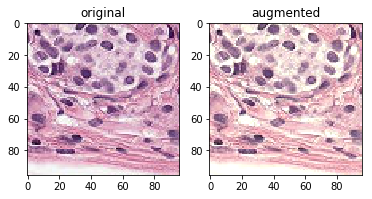

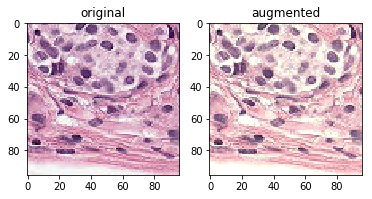

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


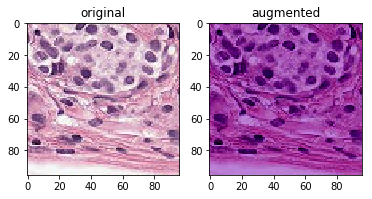

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


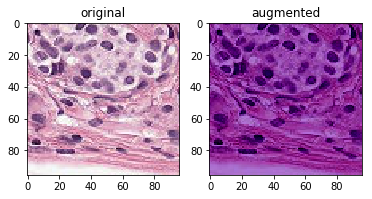

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


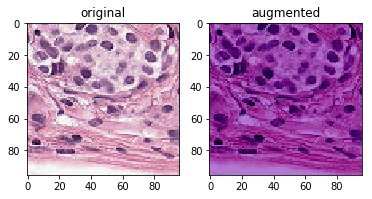

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


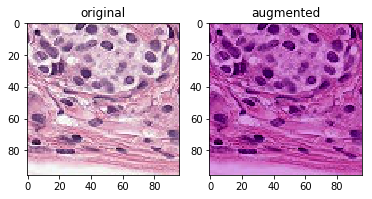

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


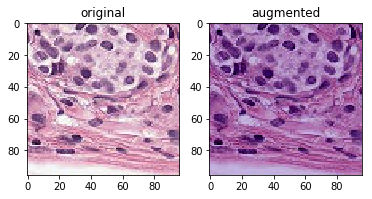

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


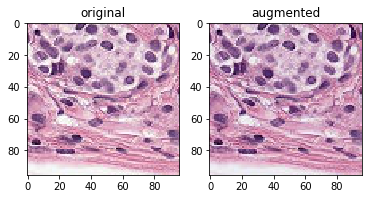

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


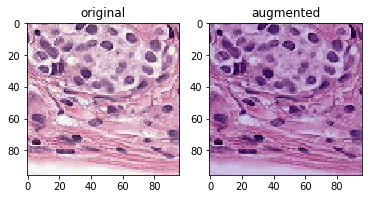

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


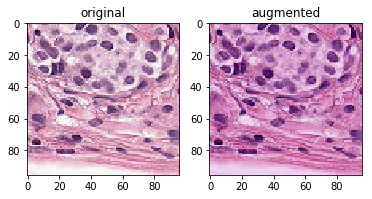

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


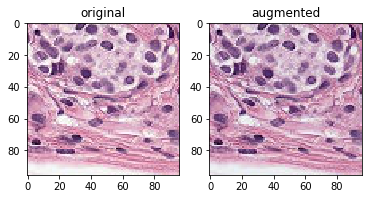

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


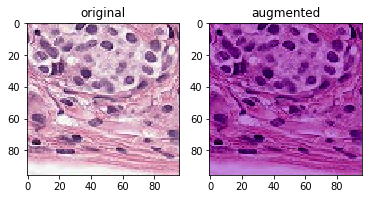

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


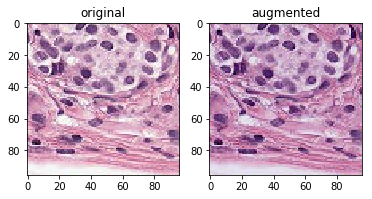

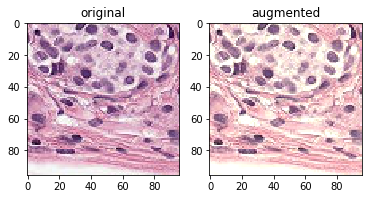

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


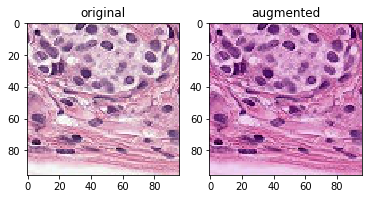

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


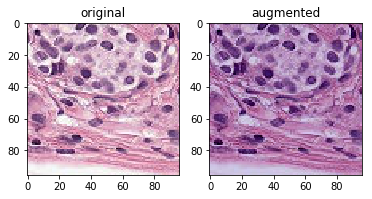

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


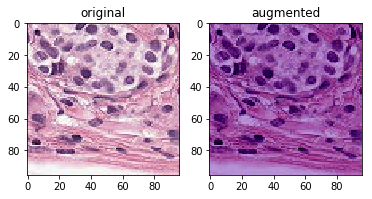

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


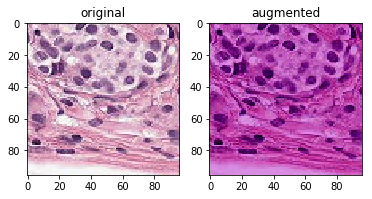

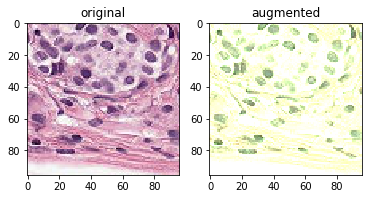

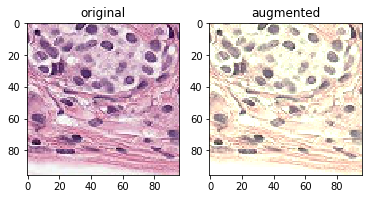

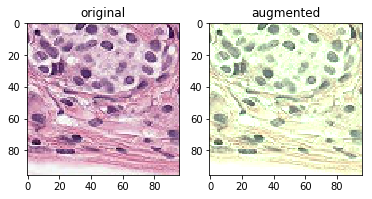

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


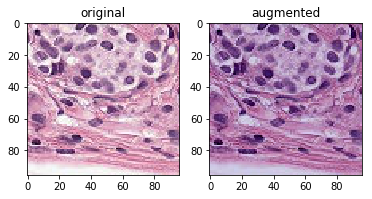

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


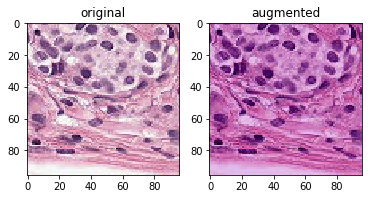

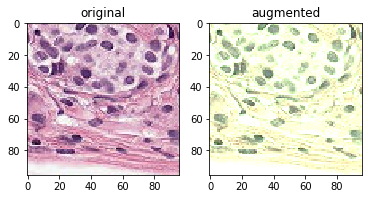

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


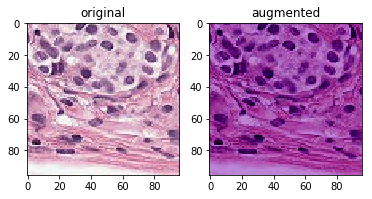

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


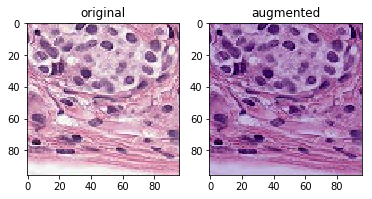

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


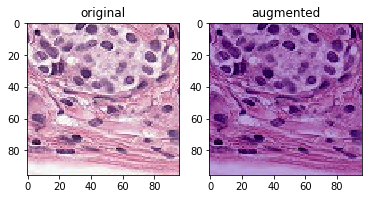

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


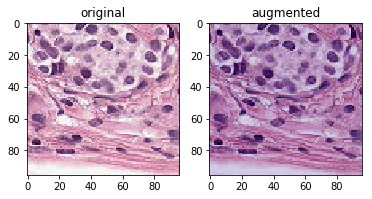

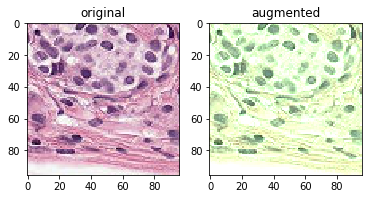

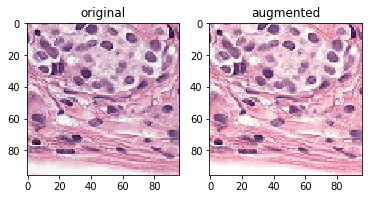

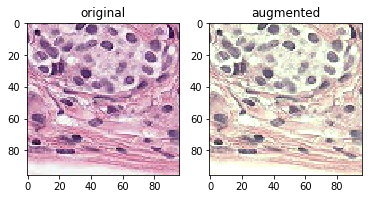

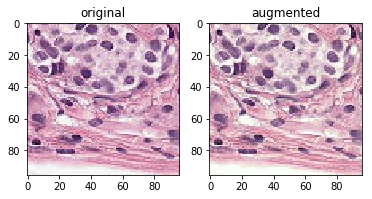

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


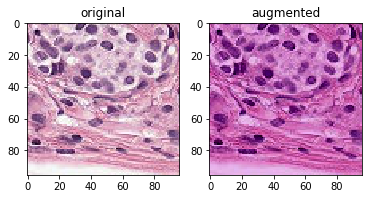

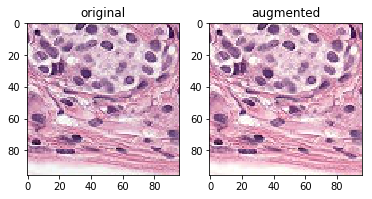

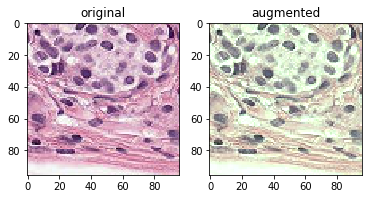

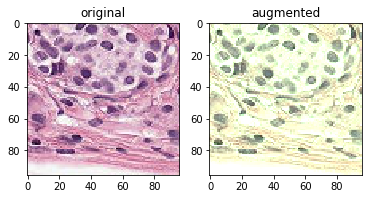

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


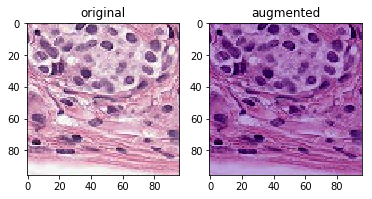

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


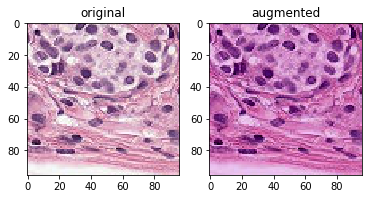

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


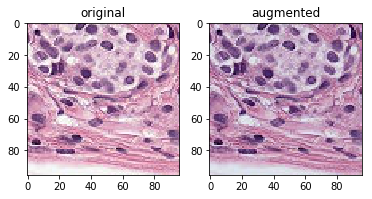

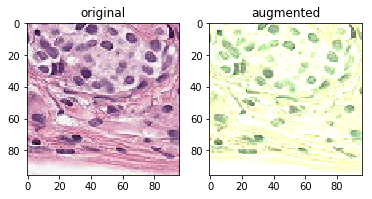

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


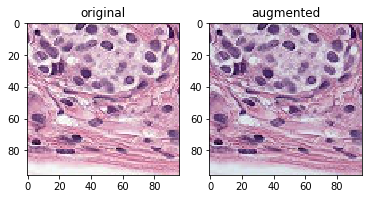

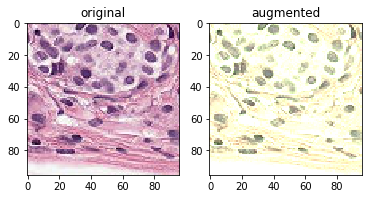

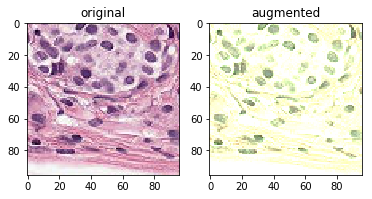

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


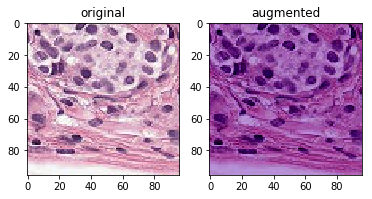

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


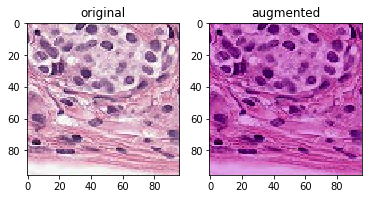

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


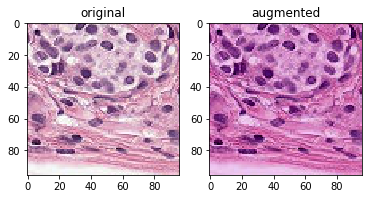

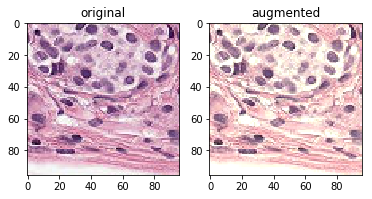

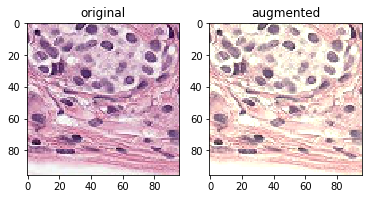

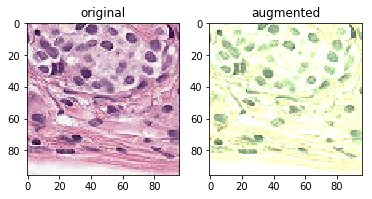

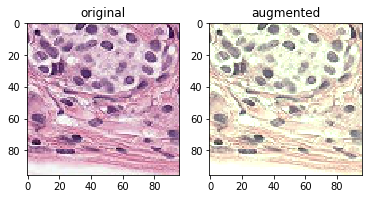

In [17]:
# test light

r = 0.05
image = x_test[1992]

for i in range(50):
    out = hed_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

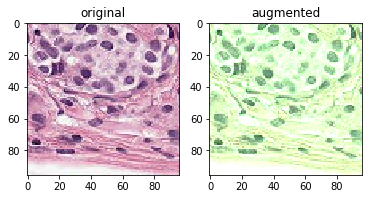

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


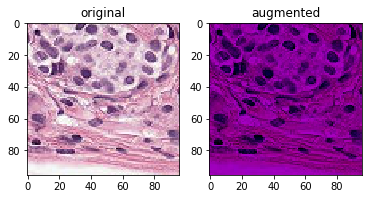

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


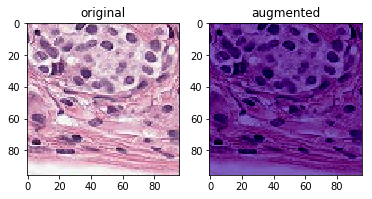

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


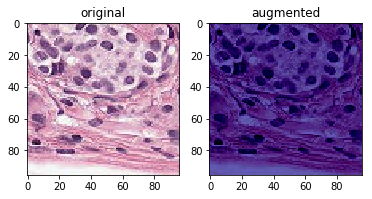

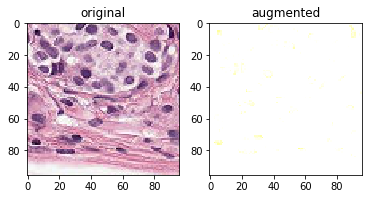

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


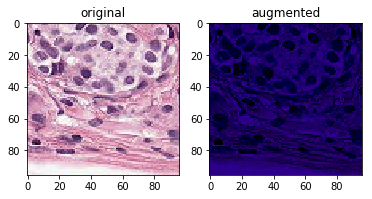

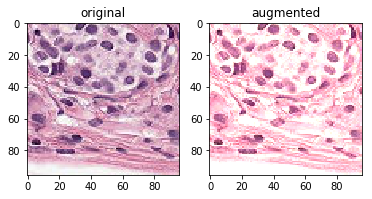

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


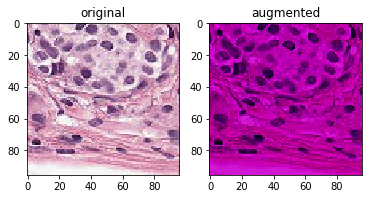

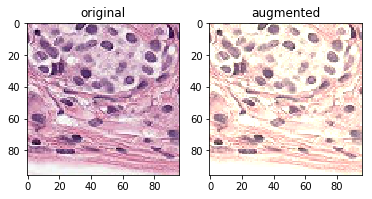

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


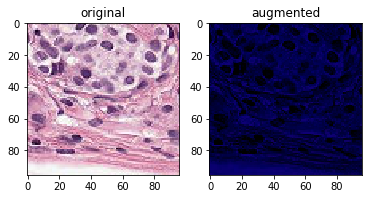

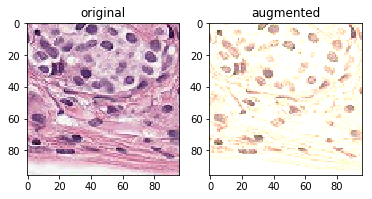

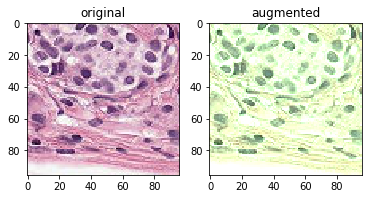

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


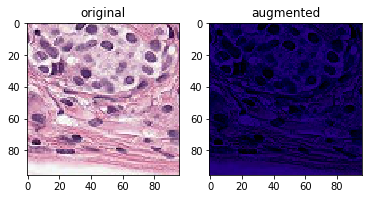

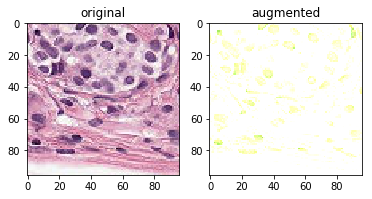

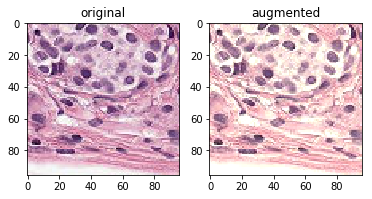

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


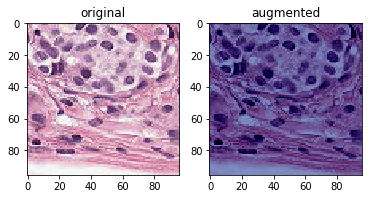

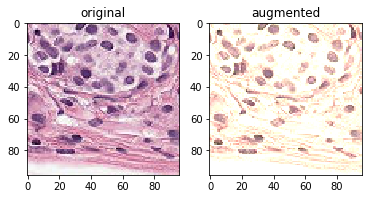

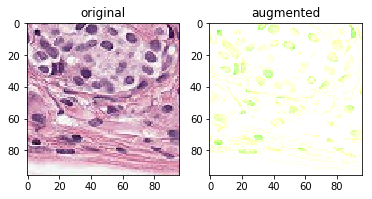

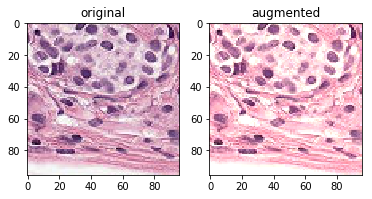

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


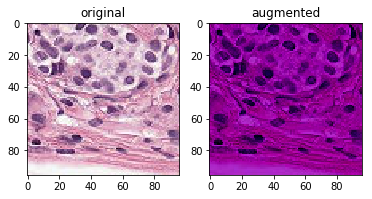

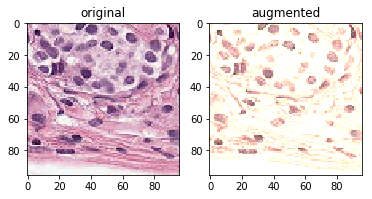

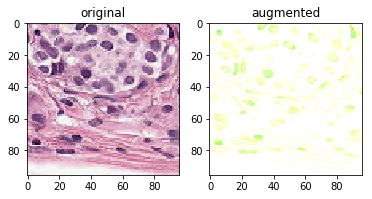

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


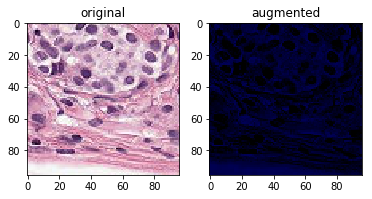

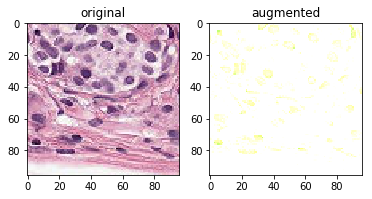

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


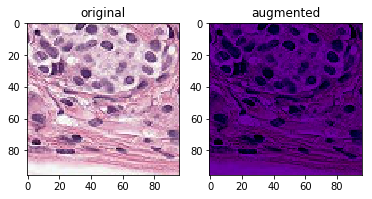

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


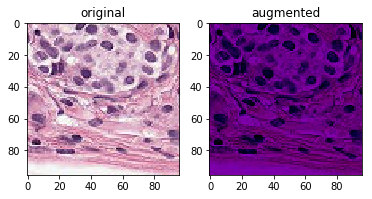

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


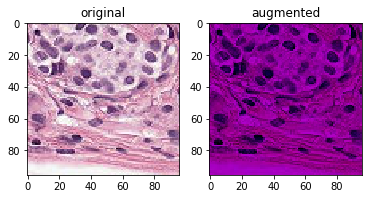

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


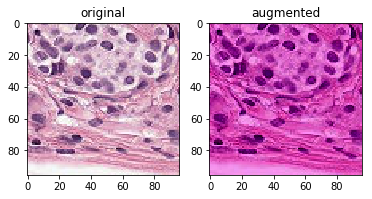

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


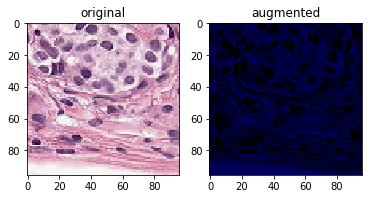

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


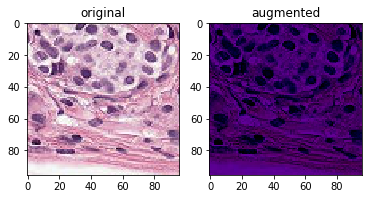

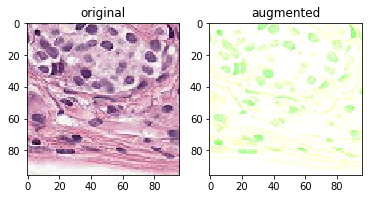

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


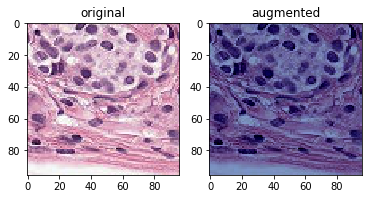

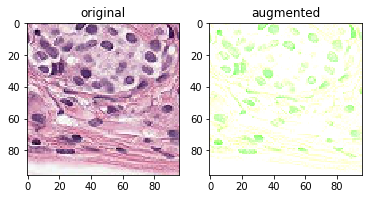

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


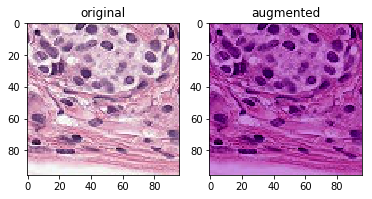

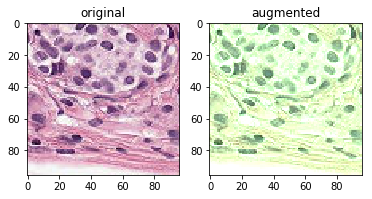

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


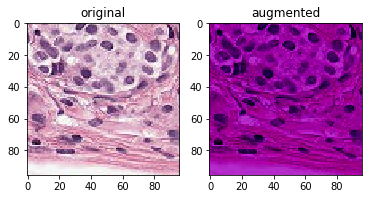

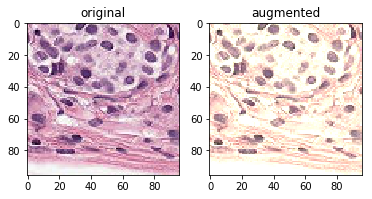

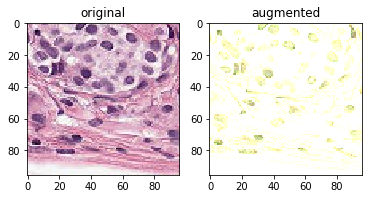

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


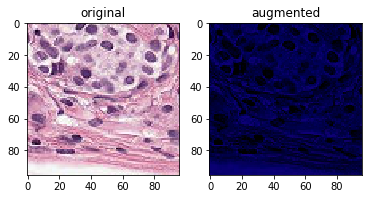

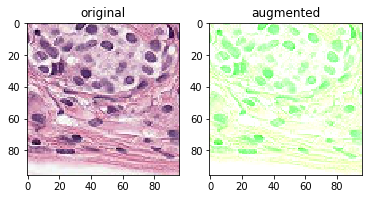

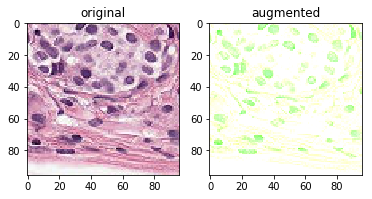

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


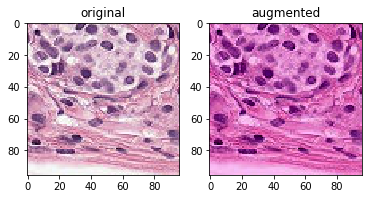

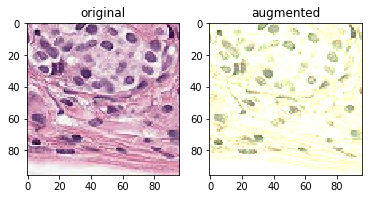

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


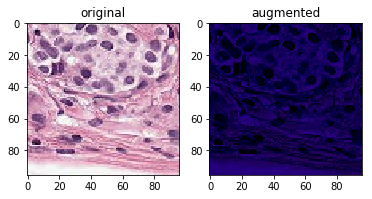

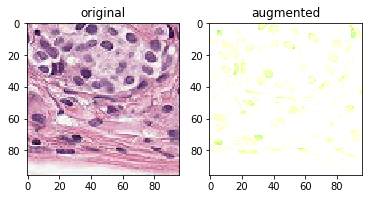

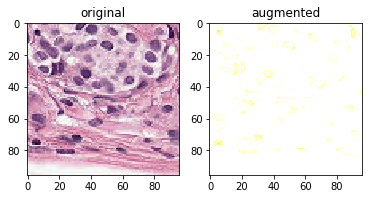

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


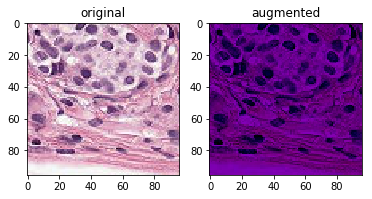

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


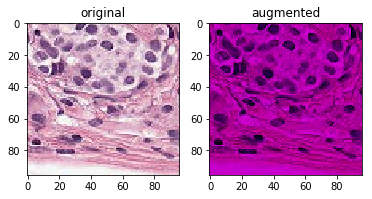

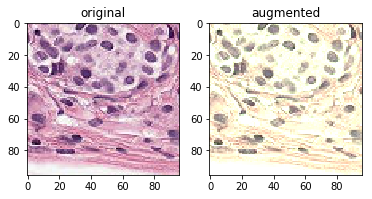

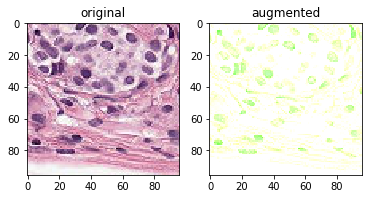

In [18]:
# test strong

r = 0.2
image = x_test[1992]

for i in range(50):
    out = hed_shifting(image, r)
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(out)
    plt.title('augmented')
    plt.show()

___________________________________

## Augmentation 

In [19]:
def Augmentation(image, rot=[0, 90], elast_a=[80, 120], elast_sig=[9.0 , 11.0], g_noise=[0,0.1],
                g_blurr=[0,0.1], brigh=[0.65,1.35], contr=[0.5,1.5], HSV=0.1, HED=None):
    
    # random rotation
    angle = sample(rot, 1)
    im = Image.fromarray(image)
    im = im.rotate(angle[0])
    im = np.array(im)
    
    # random mirroring
    im = mirroring(im)
    
    # random elastic trasform
    if getrandbits(1) > 0:
        a = np.random.uniform(low=elast_a[0], high=elast_a[1], size=1)[0]
        s = np.random.uniform(low=elast_sig[0], high=elast_sig[1], size=1)[0]
        im = elastic_transform(im, a, s)
        
    # random gaussian noise
    if getrandbits(1) > 0:
        sigma = np.random.uniform(low=g_noise[0], high=g_noise[1], size=1)[0]
        im = gaussian_noise(im, sigma)
        
    # random gaussian blurring
    if getrandbits(1) > 0:
        sigma = np.random.uniform(low=g_blurr[0], high=g_blurr[1], size=1)[0]
        im = Image.fromarray(im)
        out = im.filter(ImageFilter.GaussianBlur(sigma))
        im = np.array(im)
        
    # random brightness perturbation
    if getrandbits(1) > 0:
        br = np.random.uniform(low=brigh[0], high=brigh[1], size=1)[0]
        im = Image.fromarray(im)
        im = ImageEnhance.Brightness(im)
        im = im.enhance(br)
        im = np.array(im)
        
    # random contrast perturbation
    if getrandbits(1) > 0:
        cr = np.random.uniform(low=contr[0], high=contr[1], size=1)[0]
        im = Image.fromarray(im)
        im = ImageEnhance.Contrast(im)
        im = im.enhance(cr)
        im = np.array(im)
        
        
    hsv_flag = False
    # Hsv perturbation 
    if HSV is not None:
        hsv_flag = True
        im = hsv_shifting(im, HSV)
        
    # Hed perturbation (only if hsv not performed!)
    if (not hsv_flag) and (HED is not None):
        im = hed_shifting(im, HED)
    
    return im

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

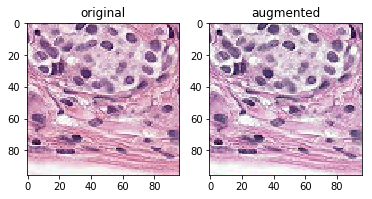

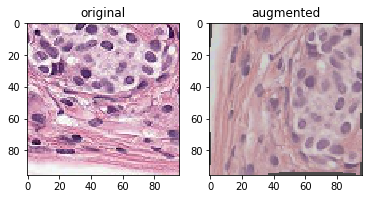

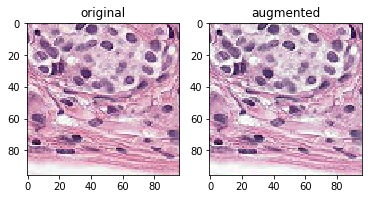

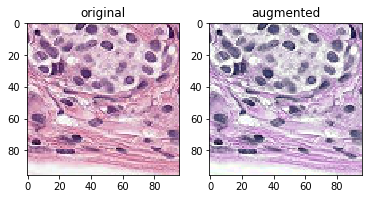

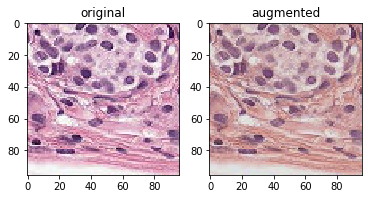

...

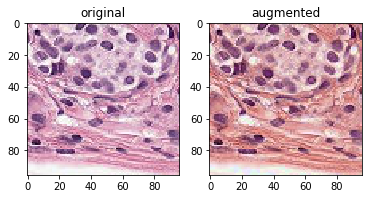

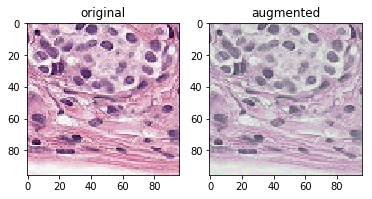

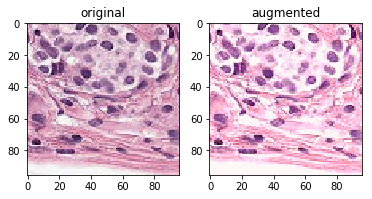

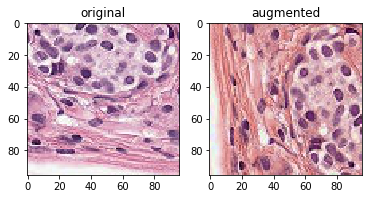

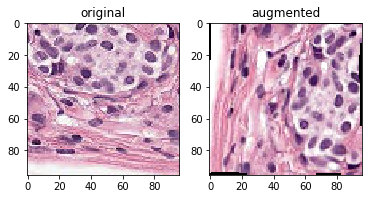

In [20]:
for i in range(20):
    plt.figure()
    plt.subplot(121)
    plt.imshow(image)
    plt.title('original')
    plt.subplot(122)
    plt.imshow(Augmentation(image))
    plt.title('augmented')
plt.show()

## Usage in DataGenerator

In [21]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, data, labels, batch_size=32, dim=(224, 224), n_channels=3,
                 n_classes=2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.data = data
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, self.n_classes))

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # preprocessing
            img_arr = self.data[ID]
            img = array_to_img(img_arr)
            img = img.resize((224,224), Image.ANTIALIAS)
            img.load()
            
            X[i] = Augmentation(np.asarray(img, dtype=np.uint8), rot=[0, 90], elast_a=[80, 120],
                                elast_sig=[9.0 , 11.0], g_noise=[0,0.1], g_blurr=[0,0.1],
                                brigh=[0.65,1.35], contr=[0.5,1.5], HSV=0.1, HED=None)

            # Store target label(one-hot-encoding)
            y[i] = to_categorical(self.labels[str(ID)], num_classes=self.n_classes)

        return X, y